## Projet 6 : Classifiez automatiquement des biens de consommation

## Contexte

Vous êtes Data Scientist au sein de l’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce.

Sur cette place de marché anglophone, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche d‘attribution de la catégorie.

Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, à partir du texte (en anglais) et de l’image.

## Librairies utilisées avec le langage Python :

In [1]:
# Importation des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from tqdm import tqdm
import keras
from keras import layers
import tensorflow as tf
from PIL import Image
import json
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix

import torch
from torchvision import transforms
from torchvision.transforms import Compose,Resize,ToTensor,Normalize
from torchvision.datasets import ImageFolder
from torch.utils.data import TensorDataset
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from tensorflow.keras.layers import GlobalAveragePooling2D,Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from keras.models import Model, Sequential
from keras.applications.vgg16 import VGG16
from keras.applications import MobileNetV2
from plot_keras_history import show_history, plot_history

import shutil
import os
import warnings
warnings.filterwarnings('ignore')


## Création d'un dataset d'images :

In [2]:
# Importation des données :
data = pd.read_csv('D:/tutorial-env/OCR/Projet6/data_img_preprocessed.csv')
data.head()

,product_name,description,image,cat_niv_1,cat_niv_1_num,chemin_image,taille,largeur,hauteur,chemin_image_traitee
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,4,D:/tutorial-env/OCR/Projet6/Flipkart/Images/55...,12960000,3600,3600,D:/tutorial-env/OCR/Projet6/Flipkart/Images tr...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,0,D:/tutorial-env/OCR/Projet6/Flipkart/Images/7b...,3087684,2388,1293,D:/tutorial-env/OCR/Projet6/Flipkart/Images tr...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,0,D:/tutorial-env/OCR/Projet6/Flipkart/Images/64...,715878,982,729,D:/tutorial-env/OCR/Projet6/Flipkart/Images tr...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,4,D:/tutorial-env/OCR/Projet6/Flipkart/Images/d4...,914100,1100,831,D:/tutorial-env/OCR/Projet6/Flipkart/Images tr...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,4,D:/tutorial-env/OCR/Projet6/Flipkart/Images/63...,5574960,2670,2088,D:/tutorial-env/OCR/Projet6/Flipkart/Images tr...


In [3]:
#  Création du dossier de destination des images classées
os.makedirs("D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees", exist_ok=True)

for _, row in data.iterrows():
    chemin = row['chemin_image']
    label = row['cat_niv_1']

    #  Sous-dossier correspondant à la catégorie
    dossier_destination = os.path.join("D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees/", label)
    os.makedirs(dossier_destination, exist_ok=True)

    #  Copie de l'image dans le sous-dossier correspondant
    shutil.copy(chemin, dossier_destination)

In [4]:
source_dir = "D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees"
train_dir = "D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees/train"
val_dir = "D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees/val"
test_dir = "D:/tutorial-env/OCR/Projet6/Flipkart/Images Classees/test"
category_path = []

for category in os.listdir(source_dir):
    category_path.append(os.path.join(source_dir, category))

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for path in category_path :
    if os.path.isdir(path):
        images = os.listdir(path)
        category = os.path.basename(path)

        # Séparation des images par catégorie en train,val,test
        train_images, temp_images = train_test_split(images, test_size=0.3, random_state=42)
        val_images, test_images = train_test_split(temp_images, test_size=0.3, random_state=42)

        for img in train_images:
            os.makedirs(os.path.join(train_dir, category), exist_ok=True)
            shutil.copy(os.path.join(path, img), os.path.join(train_dir, category, img))
        for img in val_images:
            os.makedirs(os.path.join(val_dir, category), exist_ok=True)
            shutil.copy(os.path.join(path, img), os.path.join(val_dir, category, img))
        for img in test_images:
            os.makedirs(os.path.join(test_dir, category), exist_ok=True)
            shutil.copy(os.path.join(path, img), os.path.join(test_dir, category, img))

In [5]:
#  Création des 3 datasets : train, val, test
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),
    batch_size=32
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(224, 224),
    batch_size=32
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),
    batch_size=32,
    shuffle=False
)

Found 735 files belonging to 7 classes.
Found 217 files belonging to 7 classes.
Found 98 files belonging to 7 classes.


In [6]:
#  Création des 3 datasets pour MobileNetV2 : train, val, test
train_ds_MN = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),
    batch_size=32
)

val_ds_MN  = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(224, 224),
    batch_size=32
)

test_ds_MN  = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(224, 224),
    batch_size=32,
    shuffle=False
)

Found 735 files belonging to 7 classes.
Found 217 files belonging to 7 classes.
Found 98 files belonging to 7 classes.


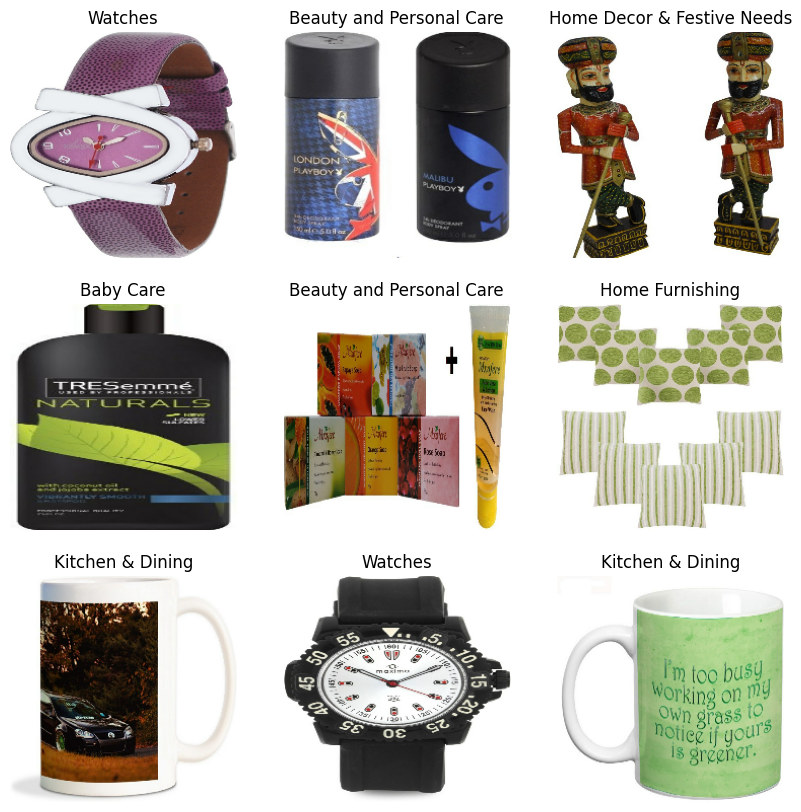

In [7]:
# Charger les noms des classes des datasets
class_names_train = train_ds.class_names
class_names_val = val_ds.class_names
class_names_test = test_ds.class_names

# Afficher les images avec les noms des classes du dataset d'entrainement
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names_train[labels[i]])
        plt.axis("off")
    plt.show()

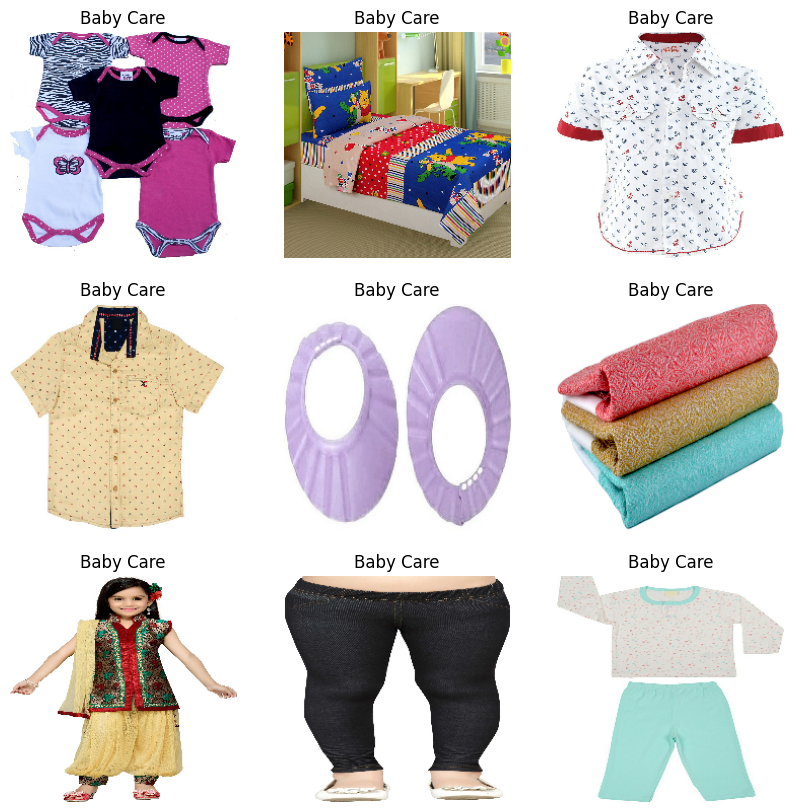

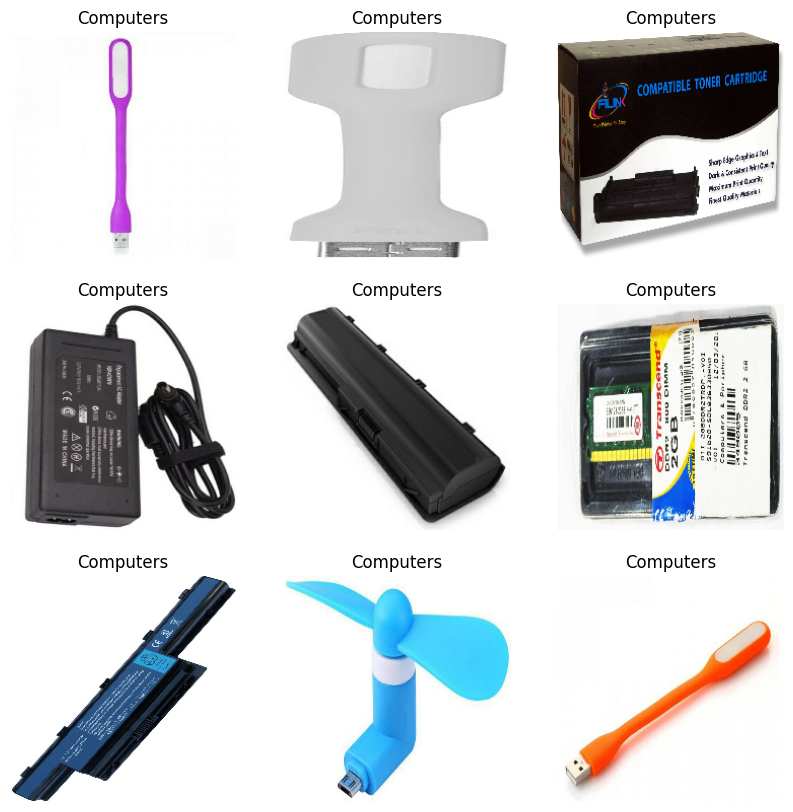

In [8]:
# Afficher les images avec les noms des classes du dataset d'entrainement
for images, labels in test_ds.take(2):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names_test[labels[i]])
        plt.axis("off")
    plt.show()

## Data augmentation :

In [9]:
# Définition de la data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1)
    ])

# Normalisation des images
normalization_layer = layers.Rescaling(1./255)

# Appliquer la data augmentation et la normalisation sur l'ensemble d'entraînement
train_ds_augmented = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds_augmented = train_ds_augmented.map(
    lambda x, y: (normalization_layer(x), y),  # Appliquer la normalisation
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds_augmented = train_ds_augmented.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding (obligatoire avec la fonction de perte categorical_crossentropy.)
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Appliquer la normalisation sur le dataset de validation (pas d'augmentation sur le dataset de validation)
val_ds = val_ds.map(
    lambda x, y: (normalization_layer(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
val_ds = val_ds.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Appliquer la normalisation sur le dataset de test (pas d'augmentation sur le dataset de test)
test_ds = test_ds.map(
    lambda x, y: (normalization_layer(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
test_ds = test_ds.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Précharger les données pour améliorer la performance
train_ds_augmented = train_ds_augmented.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Visualisation des images transformées par la data augmentation :

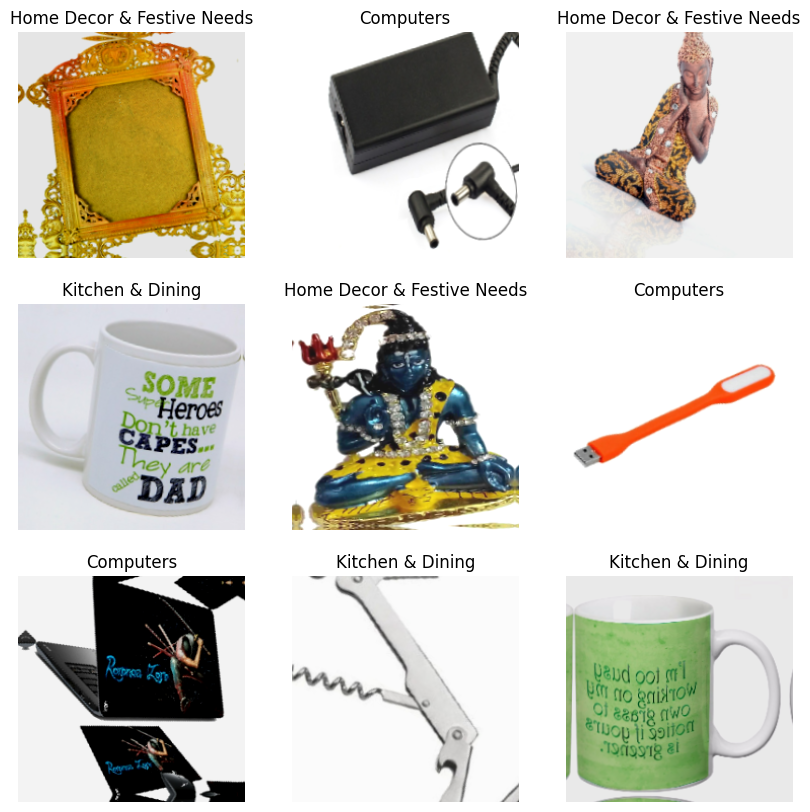

In [10]:
for images, labels in train_ds_augmented.take(1):
    label_decode = [class_names_train[np.argmax(label)] for label in labels.numpy()] #conversion des labels en noms
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(label_decode[i])
        plt.axis("off")
    plt.show()

## Classification supervisée :

### VGG 16

In [11]:
# Récupération modèle pré-entraîné
model = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# Layer non entraînables = on garde les poids du modèle pré-entraîné
for layer in model.layers:
  layer.trainable = False

# Récupérer la sortie de ce réseau
x = model.output
# Compléter le modèle
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu',kernel_regularizer = l2(0.02))(x)
x = Dropout(0.8)(x)
predictions = Dense(7, activation='softmax', kernel_regularizer = l2(0.01))(x) # 7 catégories à prédire

# Définir le nouveau modèle
model = Model(inputs=model.input, outputs=predictions)
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
# compilation du modèle
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         131,3

 Total params: 14,847,815 (56.64 MB)

 Trainable params: 133,127 (520.03 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


In [12]:
# Création du callback
model_saved = "D:/tutorial-env/OCR/Projet6/save/model-0.keras"
checkpoint = ModelCheckpoint(model_saved, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
callbacks_list = [checkpoint, es]


#### sans Data augmentation

In [13]:
train_ds = train_ds.map(
    lambda x, y: (normalization_layer(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds = train_ds.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

# Entrainement du modèle
train_0 = model.fit(
    train_ds,
    epochs=100,
    callbacks=callbacks_list,
    validation_data=val_ds,
    verbose=1
    )

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1781 - loss: 8.3519
Epoch 1: val_loss improved from inf to 5.53281, saving model to D:/tutorial-env/OCR/Projet6/save/model-0.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 177s 8s/step - accuracy: 0.1787 - loss: 8.3152 - val_accuracy: 0.4977 - val_loss: 5.5328
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.2932 - loss: 5.2359
Epoch 2: val_loss improved from 5.53281 to 3.71212, saving model to D:/tutorial-env/OCR/Projet6/save/model-0.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 136s 6s/step - accuracy: 0.2950 - loss: 5.2152 - val_accuracy: 0.6682 - val_loss: 3.7121
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4639 - loss: 3.5630
Epoch 3: val_loss improved from 3.71212 to 2.74854, saving model to D:/tutorial-env/OCR/Projet6/save/model-0.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 153s 7s/step - accuracy: 0.4646 - loss: 3.5528 - val_accuracy: 0.6959 - val_loss: 2.7485
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accurac

In [14]:
# Score de l'epoch optimal
best_epoch = np.argmin(train_0.history['val_loss'])
best_val_accuracy = train_0.history['val_accuracy'][best_epoch]
print("Best validation accuracy:", best_val_accuracy)

Best validation accuracy: 0.764976978302002


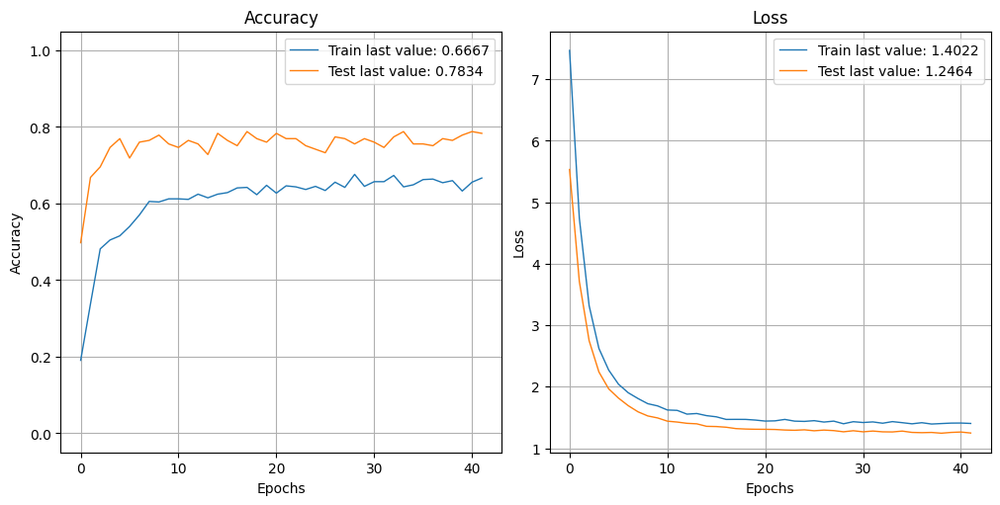

In [15]:
show_history(train_0)
plot_history(train_0, path="D:/tutorial-env/OCR/Projet6/save/standard.png")
plt.close()

On a de bons résultats grâce aux différentes régularisation. Tentons de l'améliorer avec la data augmentation.

#### avec Data augmentation

In [16]:
# Récupération modèle pré-entraîné
model_aug = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# Layer non entraînables = on garde les poids du modèle pré-entraîné
for layer in model_aug .layers:
  layer.trainable = False

# Récupérer la sortie de ce réseau
x_aug  = model_aug.output
# Compléter le modèle
x_aug  = GlobalAveragePooling2D()(x_aug)
x_aug  = Dense(256, activation='relu',kernel_regularizer = l2(0.01))(x_aug)
x_aug  = Dropout(0.8)(x_aug)
predictions_aug  = Dense(7, activation='softmax',kernel_regularizer = l2(0.01))(x_aug) # 7 catégories à prédire

model_aug = Model(inputs=model_aug .input, outputs=predictions_aug )
optimizer_aug = keras.optimizers.Adam(learning_rate=1e-3)
# compilation du modèle
model_aug.compile(loss="categorical_crossentropy", optimizer=optimizer_aug, metrics=["accuracy"])

In [17]:
# Création du callback
model_saved_aug = "D:/tutorial-env/OCR/Projet6/save/model-0_aug.keras"
checkpoint_aug = ModelCheckpoint(model_saved_aug, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es_aug = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
callbacks_list_aug = [checkpoint_aug, es_aug]

In [18]:
# Entrainement du modèle
train_0_aug = model_aug.fit(
    train_ds_augmented,
    epochs=100,
    callbacks=callbacks_list_aug,
    validation_data=val_ds,
    verbose=1
    )

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.1741 - loss: 5.5275
Epoch 1: val_loss improved from inf to 3.93910, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 166s 7s/step - accuracy: 0.1747 - loss: 5.5066 - val_accuracy: 0.4977 - val_loss: 3.9391
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2942 - loss: 3.8546
Epoch 2: val_loss improved from 3.93910 to 3.02949, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 195s 8s/step - accuracy: 0.2958 - loss: 3.8450 - val_accuracy: 0.6037 - val_loss: 3.0295
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3996 - loss: 3.0606
Epoch 3: val_loss improved from 3.02949 to 2.48491, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 159s 7s/step - accuracy: 0.3998 - loss: 3.0553 - val_accuracy: 0.6866 - val_loss: 2.4849
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/st

In [19]:
# Score de l'epoch optimal
best_epoch = np.argmin(train_0_aug.history['val_loss'])
best_val_accuracy = train_0_aug.history['val_accuracy'][best_epoch]
print("Best validation accuracy:", best_val_accuracy)

# sauvegarde du modèle
model_aug.load_weights(model_saved_aug)
model_aug.save('D:/tutorial-env/OCR/Projet6/save/model_aug.h5')

Best validation accuracy: 0.7834101319313049


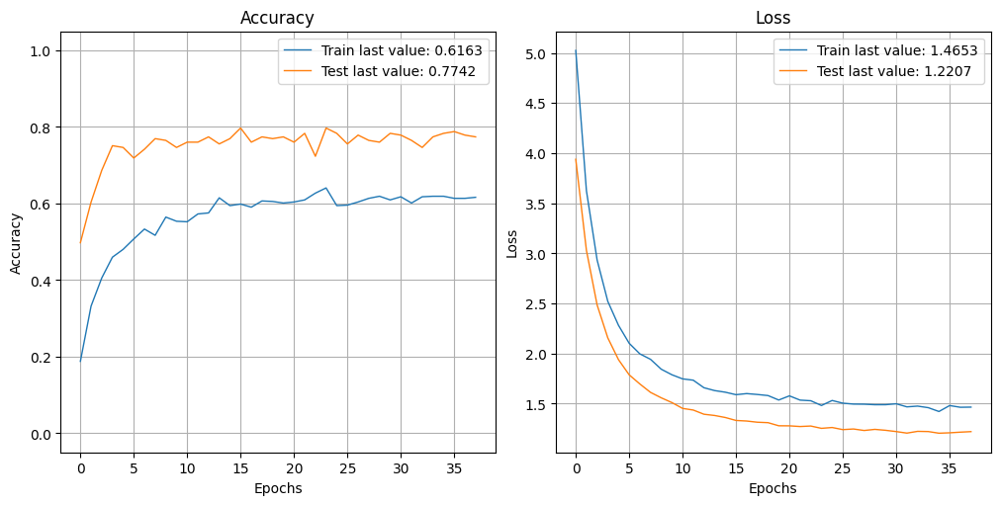

In [20]:
show_history(train_0_aug)
plot_history(train_0_aug, path="D:/tutorial-env/OCR/Projet6/save/standard.png")
plt.close()

La data augmentation a un peu amélioré les résultats.


Essayons de dégeler une partie des poids pour améliorer les résultats :

In [21]:
for layer in model_aug.layers[-6:]:
  layer.trainable = True

optimizer = keras.optimizers.Adam(learning_rate=5e-5)  # plus petit car on ne veut pas bouger trop les poids entrainés
model_aug.compile(
    optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"]
    )

# Création du callback
model_saved_aug_degel = "D:/tutorial-env/OCR/Projet6/save/model-0_aug_degel.keras"
checkpoint_aug_degel = ModelCheckpoint(model_saved_aug_degel, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es_aug_degel = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=8)
scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, verbose=1, min_lr=1e-6) #pour adapter dynamiquement le taux d'apprentissage si la validation loss ne s'améliore pas
callbacks_list_aug_degel = [checkpoint_aug_degel, es_aug_degel, scheduler]

epochs = 50
hist_aug = model_aug.fit(train_ds_augmented, epochs=epochs, callbacks=callbacks_list_aug_degel,  validation_data=val_ds, verbose=1)


Epoch 1/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6449 - loss: 1.4394
Epoch 1: val_loss improved from inf to 1.16676, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug_degel.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 151s 6s/step - accuracy: 0.6441 - loss: 1.4396 - val_accuracy: 0.7834 - val_loss: 1.1668 - learning_rate: 5.0000e-05
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6555 - loss: 1.3231
Epoch 2: val_loss improved from 1.16676 to 1.11627, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug_degel.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 156s 7s/step - accuracy: 0.6553 - loss: 1.3236 - val_accuracy: 0.7926 - val_loss: 1.1163 - learning_rate: 5.0000e-05
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.6575 - loss: 1.3587
Epoch 3: val_loss improved from 1.11627 to 1.10123, saving model to D:/tutorial-env/OCR/Projet6/save/model-0_aug_degel.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 139s 6s/step - accuracy: 0.6575 - loss: 1.3578 - val_accuracy: 0.

In [22]:
# Score de l'epoch optimal
best_epoch = np.argmin(hist_aug.history['val_loss'])
best_val_accuracy = hist_aug.history['val_accuracy'][best_epoch]
print("Best validation accuracy:", best_val_accuracy)

# sauvegarde du modèle
model_aug.load_weights(model_saved_aug_degel)
model_aug.save('D:/tutorial-env/OCR/Projet6/save/model_aug_degel.h5')

Best validation accuracy: 0.8064516186714172


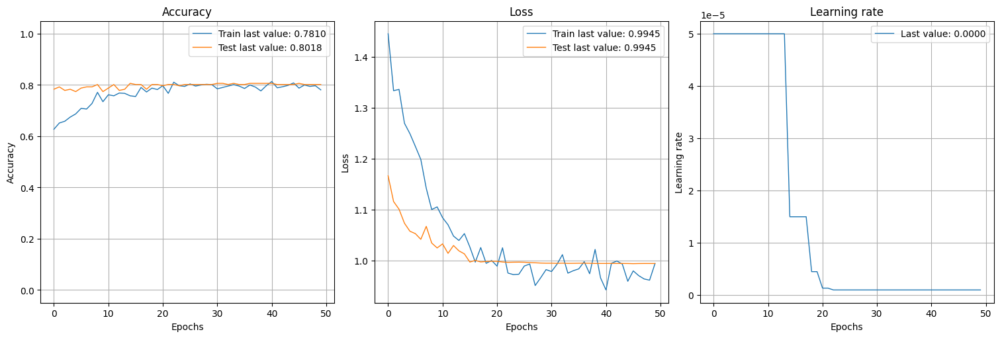

In [23]:
show_history(hist_aug)
plot_history(hist_aug, path="D:/tutorial-env/OCR/Projet6/save/standard0_aug.png")
plt.close()

Le degel des poids des dernières couches apportent des résultats un peu plus élevés mais amène un léger surapprentissage.

Passons aux prédictions :

4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 3s/step


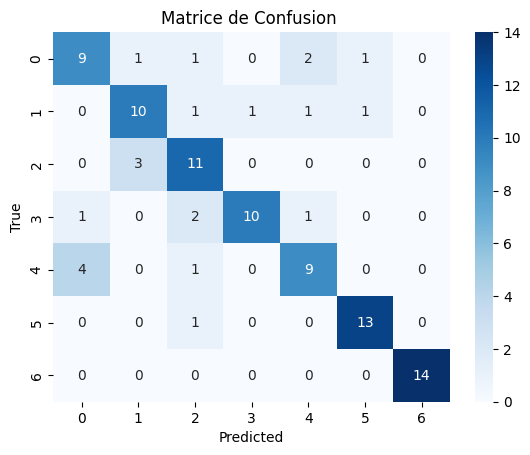

                            precision    recall  f1-score   support

                 Baby Care       0.64      0.64      0.64        14
  Beauty and Personal Care       0.71      0.71      0.71        14
                 Computers       0.65      0.79      0.71        14
Home Decor & Festive Needs       0.91      0.71      0.80        14
           Home Furnishing       0.69      0.64      0.67        14
          Kitchen & Dining       0.87      0.93      0.90        14
                   Watches       1.00      1.00      1.00        14

                  accuracy                           0.78        98
                 macro avg       0.78      0.78      0.78        98
              weighted avg       0.78      0.78      0.78        98



In [24]:
# charger le modèle optimisé
vgg16_model = keras.models.load_model('D:/tutorial-env/OCR/Projet6/save/model_aug_degel.h5')
vgg16_model.trainable = False

#  collection des images et label du dataset de test
images = []
labels = []
for im, lab in test_ds:
    images.append(im.numpy())
    labels.append(lab.numpy())
images = np.concatenate(images, axis=0)
y_true = np.concatenate(labels, axis=0)
y_true = np.argmax(y_true, axis = -1)

# prédictions sur le jeu de test
y_pred = np.argmax(vgg16_model.predict(test_ds), axis = -1)

# matrice de confusion
conf_matrix_vgg16 = confusion_matrix(y_true, y_pred)
sns.heatmap(conf_matrix_vgg16, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Matrice de Confusion ')


# afficher la matrice de confusion
plt.show()
print(classification_report(y_true, y_pred, target_names = class_names_test))

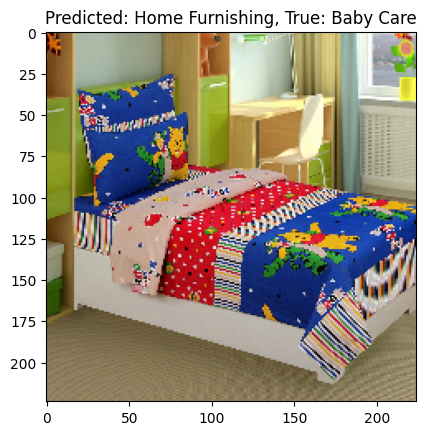

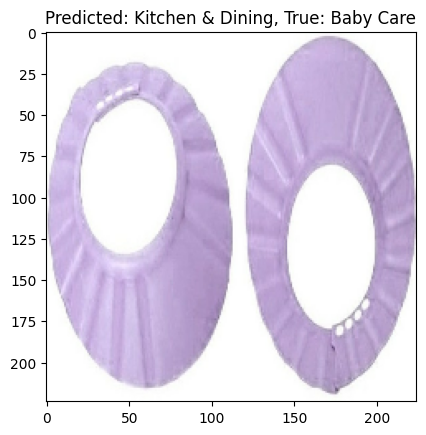

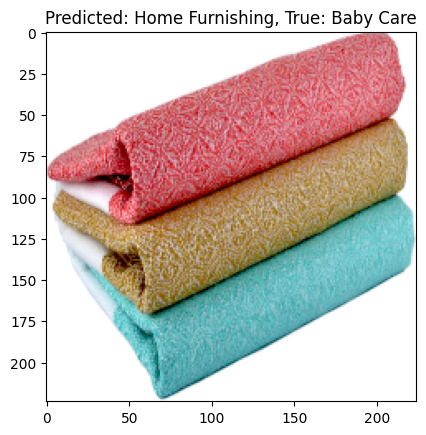

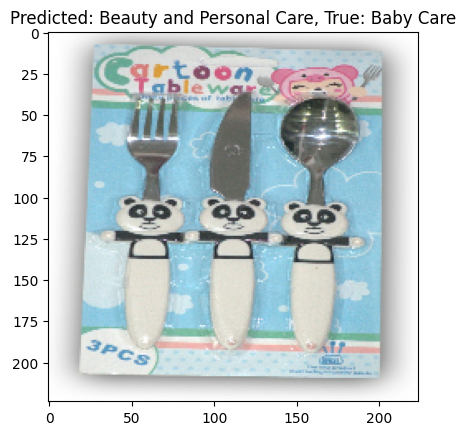

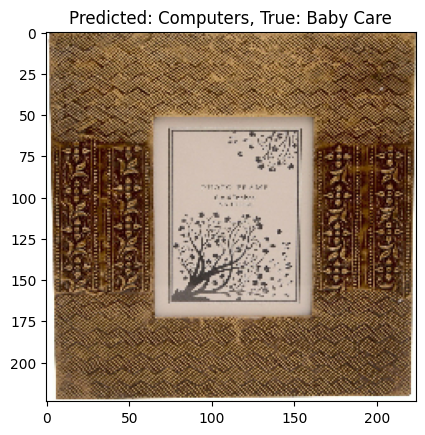

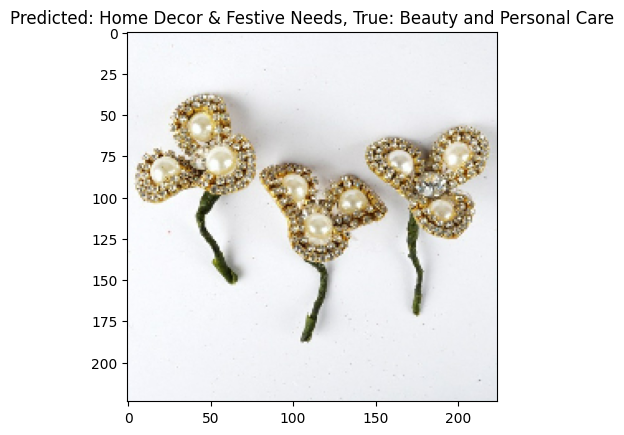

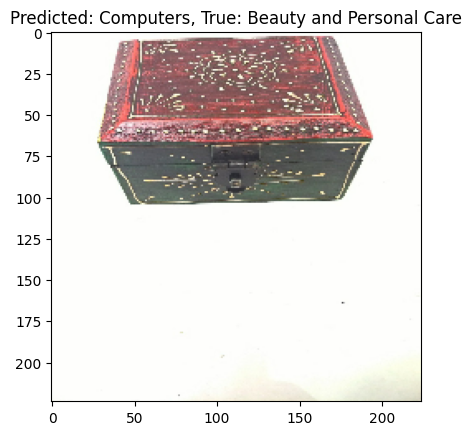

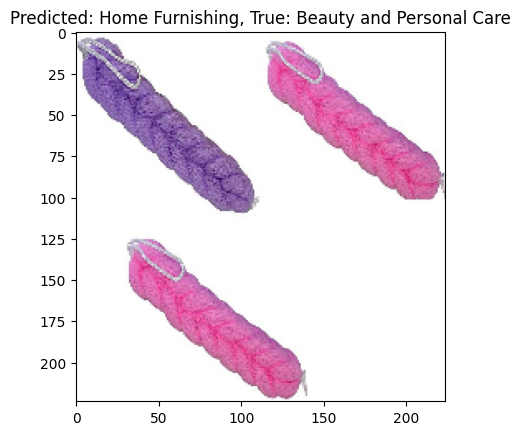

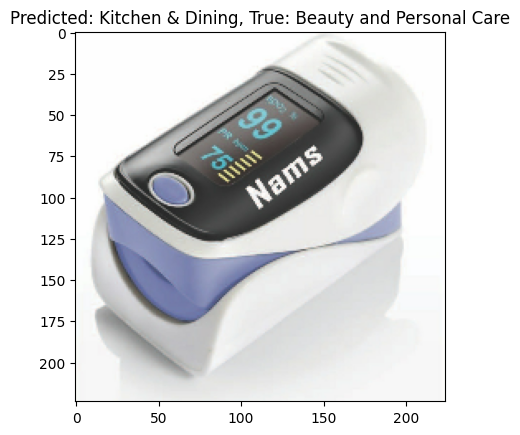

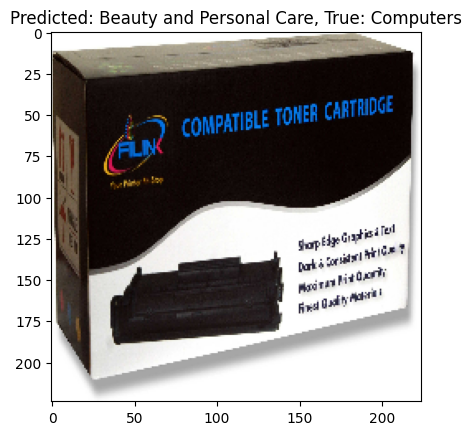

In [25]:
# Affichage des 10 premières prédictions erronnées
incorrect_pred = np.where(y_true != y_pred)[0]
for idx in incorrect_pred[:10]:
    plt.imshow(images[idx])
    plt.title(f"Predicted: {class_names_test[y_pred[idx]]}, True: {class_names_test[y_true[idx]]}")
    plt.show()


Nous avons plutôt de bonnes prédictions avec des prédictions parfaites sur la catégorie "watches".

Les erreurs les plus fréquentes sont de la catégorie "Home Furnishing" prédit en "Baby Care".

Tentons avec MobileNetv2, un modèle plus adapté au petit dataset.

### MobileNetV2 (Google - 2018)

Architecture de CNN léger conçue pour les appareils mobiles et embarqués où la puissance de calcul et la mémoire sont limitées.

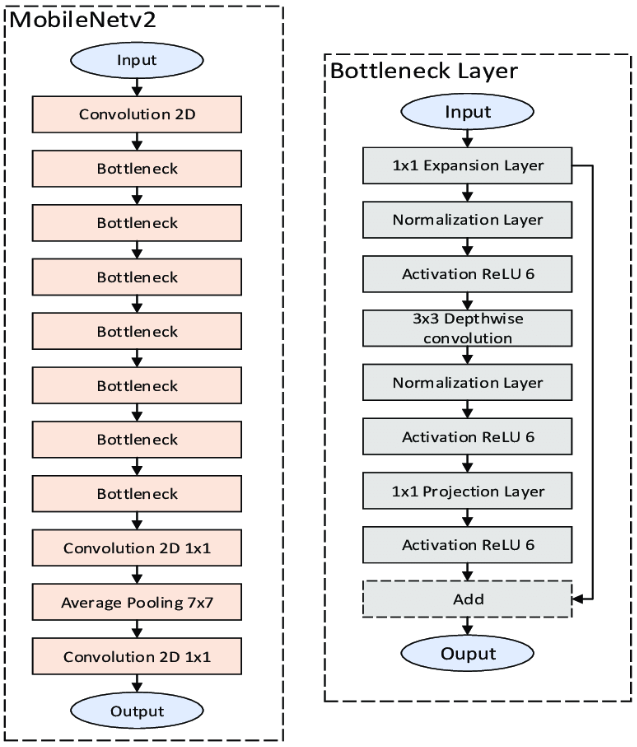



Avec ce modèle, la data augmentation doit être plus sévère pour limiter l'overfitting.

In [26]:
# Définition de la data augmentation pour MobileNet +V2
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2)
    ])

# Normalisation des images
normalization_layer = layers.Rescaling(1./255)

# Appliquer la data augmentation et la normalisation sur l'ensemble d'entraînement
train_ds_augmented_MN = train_ds_MN.map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds_augmented_MN = train_ds_augmented_MN.map(
    lambda x, y: (normalization_layer(x), y),  # Appliquer la normalisation
    num_parallel_calls=tf.data.AUTOTUNE
    )
train_ds_augmented_MN = train_ds_augmented_MN.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding (obligatoire avec la fonction de perte categorical_crossentropy.)
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Appliquer la normalisation sur le dataset de validation (pas d'augmentation sur le dataset de validation)
val_ds_MN = val_ds_MN.map(
    lambda x, y: (normalization_layer(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
val_ds_MN = val_ds_MN.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Appliquer la normalisation sur le dataset de test (pas d'augmentation sur le dataset de test)
test_ds_MN = test_ds_MN.map(
    lambda x, y: (normalization_layer(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
    )
test_ds_MN = test_ds_MN.map(
    lambda x, y: (x, to_categorical(y, num_classes=7)),  # Convertir les labels des 7 catégories en one hot encoding
    num_parallel_calls=tf.data.AUTOTUNE
    )

# Précharger les données pour améliorer la performance
train_ds_augmented_MN = train_ds_augmented_MN.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds_MN = val_ds_MN.prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds_MN = test_ds_MN.prefetch(buffer_size=tf.data.AUTOTUNE)

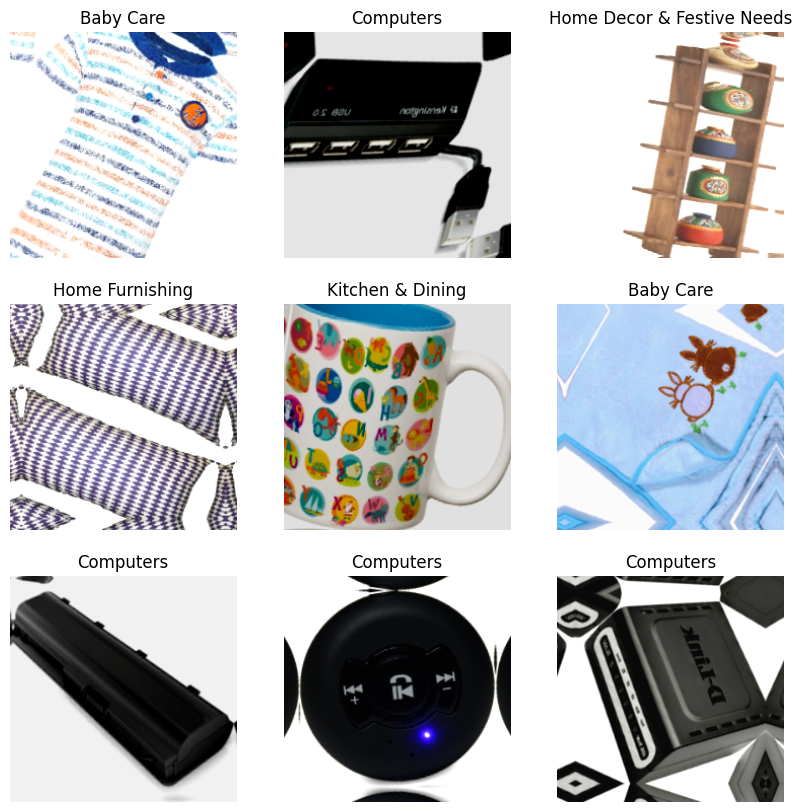

In [27]:
for images, labels in train_ds_augmented_MN.take(1):
    label_decode = [class_names_train[np.argmax(label)] for label in labels.numpy()] #conversion des labels en noms
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(label_decode[i])
        plt.axis("off")
    plt.show()

Entrainement du modèle MobileNetV2 :

In [31]:
# Récupération modèle pré-entraîné
model_MN = MobileNetV2(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# Layer non entraînables = on garde les poids du modèle pré-entraîné
for layer in model_MN.layers:
  layer.trainable = False

# Récupérer la sortie de ce réseau
x = model_MN.output
# Compléter le modèle
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu',kernel_regularizer = l2(0.01))(x) # réduction de la taille des couches (256->128) pour éviter l'overfitting
x = Dropout(0.8)(x)
predictions = Dense(7, activation='softmax',kernel_regularizer = l2(0.01))(x) # 7 catégories à prédire

# Définir le nouveau modèle
model_MN = Model(inputs=model_MN.input, outputs=predictions)
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
# compilation du modèle
model_MN.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

print(model_MN.summary())

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer_5[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,422,855 (9.24 MB)

 Trainable params: 164,871 (644.03 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


In [32]:
# Création du callback
model_MN_saved = "D:/tutorial-env/OCR/Projet6/save/model-MN.keras"
checkpoint_MN = ModelCheckpoint(model_MN_saved, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es_MN = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=2)
callbacks_list_MN = [checkpoint_MN, es_MN]


In [33]:
# Entrainement du modèle
train_MN = model_MN.fit(
    train_ds_augmented_MN,
    epochs=100,
    callbacks=callbacks_list_MN,
    validation_data=val_ds_MN,
    verbose=1
    )

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 595ms/step - accuracy: 0.1902 - loss: 5.0724
Epoch 1: val_loss improved from inf to 3.54146, saving model to D:/tutorial-env/OCR/Projet6/save/model-MN.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 26s 844ms/step - accuracy: 0.1920 - loss: 5.0503 - val_accuracy: 0.6912 - val_loss: 3.5415
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.2968 - loss: 3.8397
Epoch 2: val_loss improved from 3.54146 to 3.01341, saving model to D:/tutorial-env/OCR/Projet6/save/model-MN.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 791ms/step - accuracy: 0.2983 - loss: 3.8341 - val_accuracy: 0.7650 - val_loss: 3.0134
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - accuracy: 0.4311 - loss: 3.3192
Epoch 3: val_loss improved from 3.01341 to 2.58521, saving model to D:/tutorial-env/OCR/Projet6/save/model-MN.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 796ms/step - accuracy: 0.4321 - loss: 3.3152 - val_accuracy: 0.8065 - val_loss: 2.5852
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s

In [34]:
# Score de l'epoch optimal
best_epoch = np.argmin(train_MN.history['val_loss'])
best_val_accuracy = train_MN.history['val_accuracy'][best_epoch]
print("Best validation accuracy:", best_val_accuracy)

# sauvegarde du modèle
model_MN.load_weights(model_MN_saved)
model_MN.save('D:/tutorial-env/OCR/Projet6/save/model_MN.h5')

Best validation accuracy: 0.8248847723007202


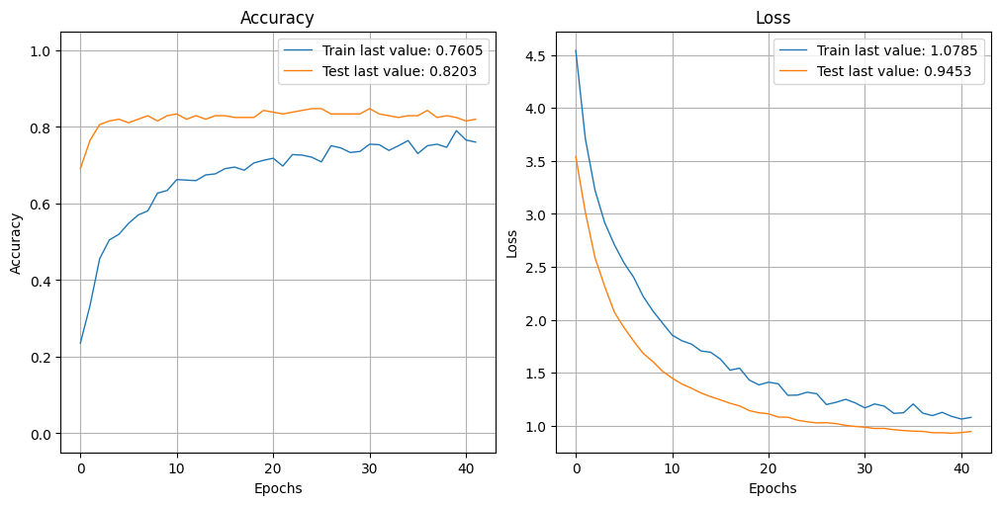

In [35]:
show_history(train_MN)
plot_history(train_MN, path="D:/tutorial-env/OCR/Projet6/save/standard.png")
plt.close()

Les résultats sont meilleurs qu'avec VGG16.

Tentons de les améliorer en dégelant une partie des poids :

In [36]:
for layer in model_MN.layers[-6:]:
  layer.trainable = True

optimizer = keras.optimizers.Adam(learning_rate=5e-5)
model_MN.compile(
    optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"]
    )

# Création du callback
model_MN_saved_degel = "D:/tutorial-env/OCR/Projet6/save/model-MN_degel.keras"
checkpoint_MN_degel = ModelCheckpoint(model_MN_saved_degel, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es_MN_degel = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=8)
scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, verbose=1, min_lr=1e-6) #pour adapter dynamiquement le taux d'apprentissage si la validation loss ne s'améliore pas
callbacks_list_MN_degel = [checkpoint_MN_degel, es_MN_degel, scheduler]

epochs = 50
hist_MN = model_MN.fit(train_ds_augmented_MN, epochs=epochs, callbacks=callbacks_list_MN_degel, validation_data=val_ds_MN,verbose=1)

Epoch 1/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 711ms/step - accuracy: 0.7404 - loss: 1.1020
Epoch 1: val_loss improved from inf to 0.92804, saving model to D:/tutorial-env/OCR/Projet6/save/model-MN_degel.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.7403 - loss: 1.1033 - val_accuracy: 0.8341 - val_loss: 0.9280 - learning_rate: 5.0000e-05
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - accuracy: 0.7618 - loss: 1.0880
Epoch 2: val_loss did not improve from 0.92804
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 830ms/step - accuracy: 0.7621 - loss: 1.0871 - val_accuracy: 0.8295 - val_loss: 0.9328 - learning_rate: 5.0000e-05
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - accuracy: 0.7530 - loss: 1.1062
Epoch 3: val_loss did not improve from 0.92804

Epoch 3: ReduceLROnPlateau reducing learning rate to 1.4999999621068127e-05.
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 846ms/step - accuracy: 0.7530 - loss: 1.1061 - val_accuracy: 0.8295 - val_loss: 0.9357 - learning_rate: 5.0000e-05
Epoch 4/50
23/23 

In [37]:
# Score de l'epoch optimal
best_epoch = np.argmin(hist_MN.history['val_loss'])
best_val_accuracy = hist_MN.history['val_accuracy'][best_epoch]
print("Best validation accuracy:", best_val_accuracy)

# sauvegarde du modèle
model_MN.load_weights(model_MN_saved_degel)
model_MN.save('D:/tutorial-env/OCR/Projet6/save/model_MN_degel.h5')

Best validation accuracy: 0.8341013789176941


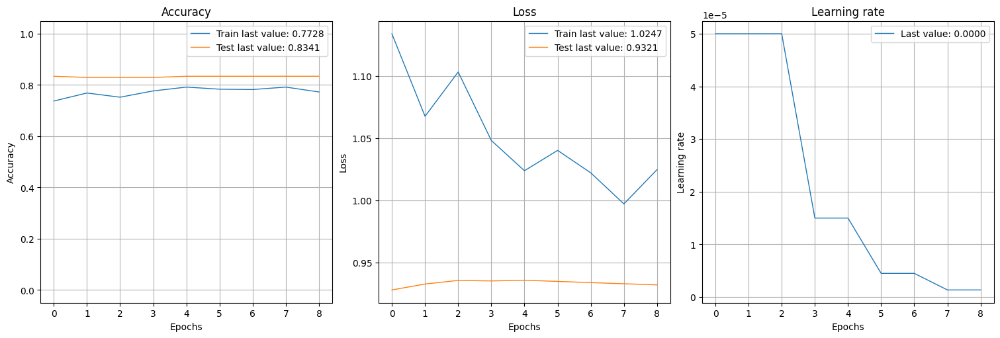

In [38]:
show_history(hist_MN)
plot_history(hist_MN, path="D:/tutorial-env/OCR/Projet6/save/standard1.png")
plt.close()

Les résultats sont meilleurs qu'avec VGG16. Mais là aussi le dégel des poids des dernières couches améliore peu les résultats.

Passons aux prédictions :

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step


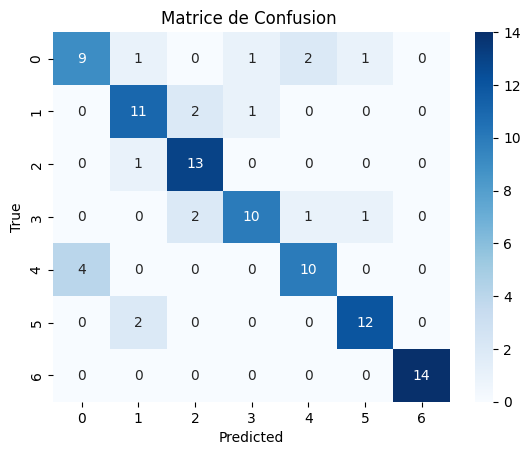

                            precision    recall  f1-score   support

                 Baby Care       0.69      0.64      0.67        14
  Beauty and Personal Care       0.73      0.79      0.76        14
                 Computers       0.76      0.93      0.84        14
Home Decor & Festive Needs       0.83      0.71      0.77        14
           Home Furnishing       0.77      0.71      0.74        14
          Kitchen & Dining       0.86      0.86      0.86        14
                   Watches       1.00      1.00      1.00        14

                  accuracy                           0.81        98
                 macro avg       0.81      0.81      0.80        98
              weighted avg       0.81      0.81      0.80        98



In [39]:
# charger le modèle optimisé
MN_model = keras.models.load_model('D:/tutorial-env/OCR/Projet6/save/model_MN_degel.h5')
MN_model.trainable = False

#  collection des images et label du dataset de test
images = []
labels = []
for im, lab in test_ds_MN:
    images.append(im.numpy())
    labels.append(lab.numpy())
images = np.concatenate(images, axis=0)
y_true = np.concatenate(labels, axis=0)
y_true = np.argmax(y_true, axis = -1)

# prédictions sur le jeu de test
y_pred = np.argmax(MN_model.predict(test_ds_MN), axis = -1)

# matrice de confusion
conf_matrix_MN = confusion_matrix(y_true, y_pred)
sns.heatmap(conf_matrix_MN, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Matrice de Confusion ')


# afficher la matrice de confusion
plt.show()
print(classification_report(y_true, y_pred, target_names = class_names_test))

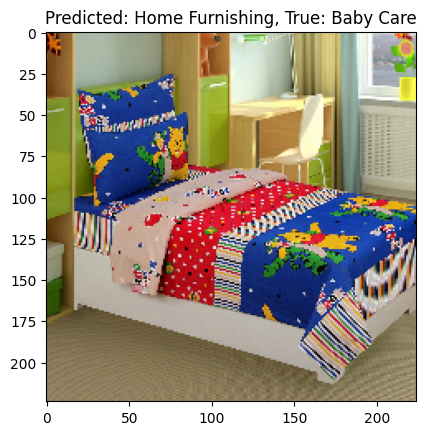

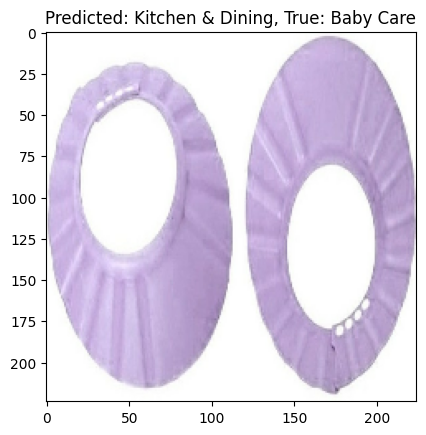

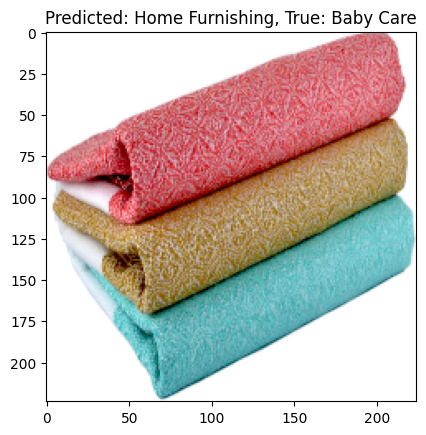

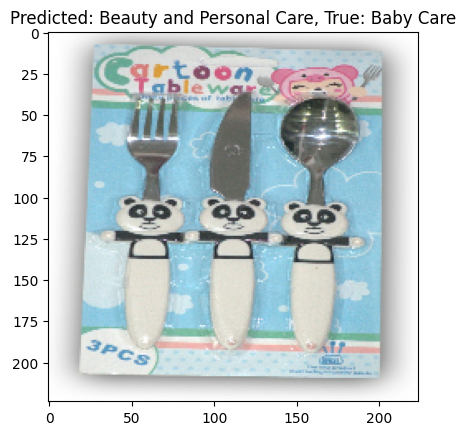

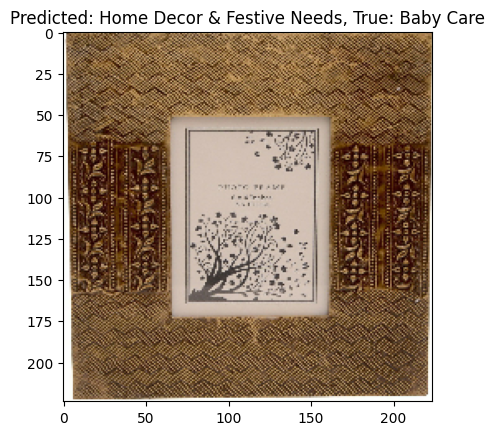

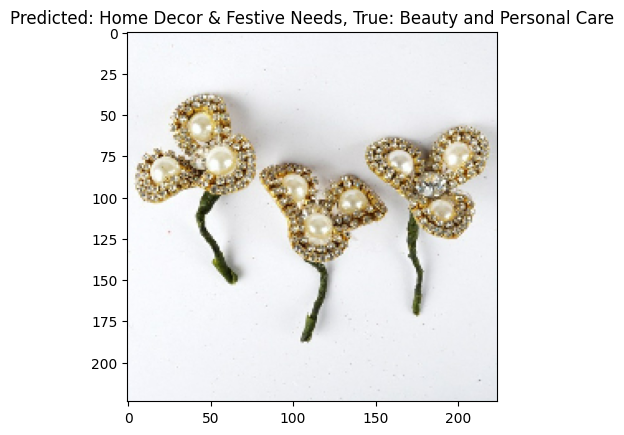

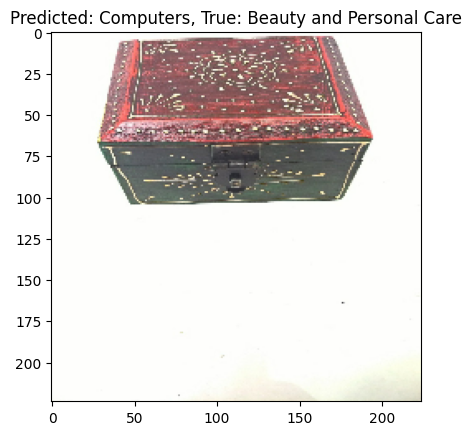

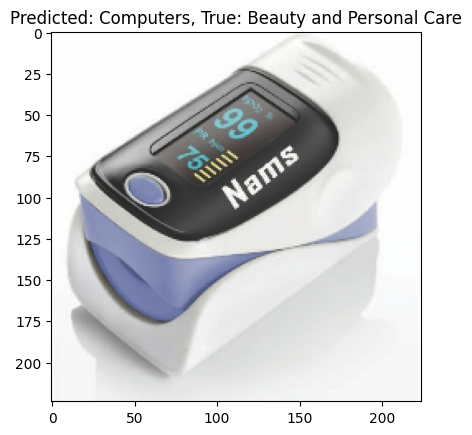

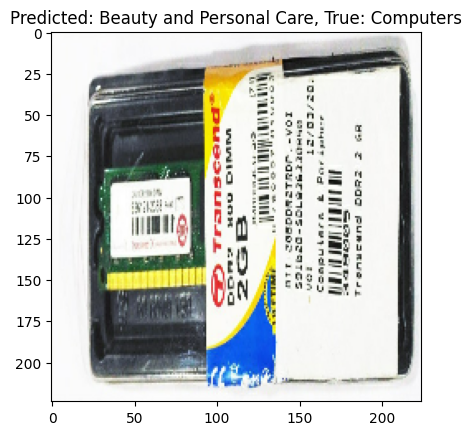

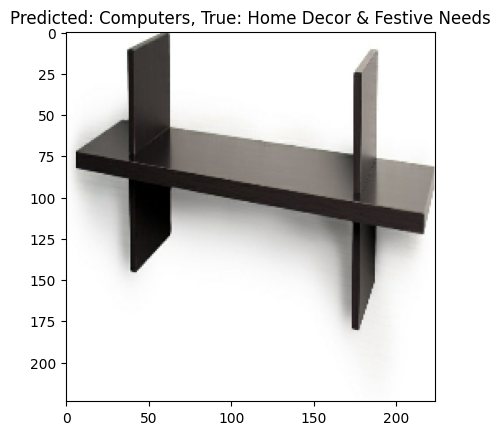

In [40]:
# Affichage des 10 premières prédictions erronnées
incorrect_pred = np.where(y_true != y_pred)[0]
for idx in incorrect_pred[:10]:
    plt.imshow(images[idx])
    plt.title(f"Predicted: {class_names_test[y_pred[idx]]}, True: {class_names_test[y_true[idx]]}")
    plt.show()

La classification supervisée avec MobileNetV2 donne de très bons résultats avec une classification parfaite pour la catégorie "Watches".

Comme pour VGG16, les erreurs les plus fréquentes sont de la catégorie "Home Furnishing" prédit en "Baby Care".

## Conclusion :

L'étude de faisabilité confirme qu'il est possible de réaliser une classification supervisée avec de bons résultats sur ce dataset.

La data augmentation ainsi que le degel des poids des dernières couches ne paraissent pas être essentiels dans ce cas.

Le choix de MobileNetV2 parait plus cohérent avec ce dataset car il apporte de meilleurs résultats.


###Test avec DinoV2

In [ ]:
# Récupération modèle pré-entraîné
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')

model.to(torch.device("cpu"))

for param in model.parameters():
    param.requires_grad = False

Transformation des images Tensorflow en Tensors Pytorch pour qu'elles soient compatible avec Dino V2 qui est basé sur un Vision Transformer (VIT).

In [ ]:
class TensorFlowToPyTorchDataset(Dataset):
    def __init__(self, tf_dataset):
        self.tf_dataset = tf_dataset

    def __len__(self):
        return len(self.tf_dataset)

    def __getitem__(self, idx):
        # Récupérer un batch TensorFlow
        batch = list(self.tf_dataset)[idx]
        images, labels = batch

        # Convertir les images TensorFlow en format NumPy
        images = images.numpy()

        # Convertir en Tensor PyTorch
        images = torch.tensor(images)

        images = images.permute(0,3,1,2) #Convertir les images de format Tensorflow (B, H, W, C) en pytorch (B, C, H, W)
        # # B= Batch / H = hauteur / W = largeur / C = canaux

        # Convertir les labels en Tensor Pytorch
        labels = labels.numpy()
        labels = torch.tensor(labels, dtype = torch.float32) #labels déjà one-hot encodés

        return images, labels

# Convertir train_ds_augmented en un DataLoader PyTorch
train_pytorch_dataset = TensorFlowToPyTorchDataset(train_ds_augmented)
train_dataloader = DataLoader(train_pytorch_dataset, shuffle=True)

# Convertir val_ds en un DataLoader PyTorch
val_pytorch_dataset = TensorFlowToPyTorchDataset(val_ds)
val_dataloader = DataLoader(val_pytorch_dataset, shuffle=True)

Extraction des tenseurs des images :

In [ ]:
# Données d'entrainement
train_all_embeddings = []
train_all_labels = []

with torch.no_grad():
  for image, label in train_dataloader:
     # Si première dimension =1, la supprimer
    if image.shape[0] == 1 :
      image = image.squeeze(axis = 0) #suppression de la premiere dimension de batch
    if label.shape[0] == 1 :
      label = label.squeeze(axis = 0) #suppression de la premiere dimension de batch

    # Création des embeddings par image
    embeddings = model(image)

    # Stockage dans une liste
    train_all_embeddings.append(embeddings)
    train_all_labels.append(label)

max_batch_size = 32
# Compléter les embeddings et labels si un batch a une taille inférieure à 32 (padding)
for i in range(len(train_all_embeddings)):

  if train_all_embeddings[i].shape[0] < max_batch_size:
    padding_size = max_batch_size - train_all_embeddings[i].shape[0]
    padding = torch.zeros(padding_size, train_all_embeddings[i].shape[1])
    train_all_embeddings[i] = torch.cat([train_all_embeddings[i], padding], dim=0)

  if train_all_labels[i].shape[0] < max_batch_size:
    padding_size = max_batch_size -  train_all_labels[i].shape[0]
    padding = torch.zeros(padding_size,  train_all_labels[i].shape[1])
    train_all_labels[i] = torch.cat([ train_all_labels[i], padding], dim=0)

# Conversion des listes en tensors pour le classifieur
train_all_embeddings = torch.cat(train_all_embeddings, dim=0)
train_all_labels = torch.cat(train_all_labels, dim=0)


In [ ]:
# Données de validation
val_all_embeddings = []
val_all_labels = []

with torch.no_grad():
  for image, label in val_dataloader:
     # Si première dimension =1, la supprimer
    if image.shape[0] == 1 :
      image = image.squeeze(axis = 0) #suppression de la premiere dimension de batch
    if label.shape[0] == 1 :
      label = label.squeeze(axis = 0) #suppression de la premiere dimension de batch

    # Création des embeddings par image
    embeddings = model(image)

    # Stockage dans une liste
    val_all_embeddings.append(embeddings)
    val_all_labels.append(label)

max_batch_size = 32
# Compléter les embeddings et labels si un batch a une taille inférieure à 32 (padding)
for i in range(len(val_all_embeddings)):

  if val_all_embeddings[i].shape[0] < max_batch_size:
    padding_size = max_batch_size - val_all_embeddings[i].shape[0]
    padding = torch.zeros(padding_size, val_all_embeddings[i].shape[1])
    val_all_embeddings[i] = torch.cat([val_all_embeddings[i], padding], dim=0)

  if val_all_labels[i].shape[0] < max_batch_size:
    padding_size = max_batch_size - val_all_labels[i].shape[0]
    padding = torch.zeros(padding_size,  val_all_labels[i].shape[1])
    val_all_labels[i] = torch.cat([ val_all_labels[i], padding], dim=0)

# Conversion des listes en tensors pour le classifieur
val_all_embeddings = torch.cat(val_all_embeddings, dim=0)
val_all_labels = torch.cat(val_all_labels, dim=0)


Entrainement du classifieur :

In [ ]:
# Définir un classifieur simple
class Classifier(nn.Module):
    def __init__(self, input_dim, output_dim, dropout_rate = 0.6, l2_reg = 0.01):
        super(Classifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(256, output_dim)  # 7 classes
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        x = self.softmax(x)  # Probabilités pour les classes
        return x

# Définir Earlystopping
class EarlyStopping:
    def __init__(self, patience=3, delta=0.01, path='best_model.pth', verbose = False):
        self.patience = patience
        self.delta = delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.path = path
        self.verbose = verbose

    def __call__(self, val_loss, model):
        if self.best_loss is None or val_loss < self.best_loss - self.delta :
            self.best_loss = val_loss
            self.save_checkpoint(model)
            self.counter = 0
            if self.verbose :
              print(f"Validation loss improved to {val_loss:.4f}. Saving model.")

        else:
            self.counter += 1
            if self.verbose :
              print(f"Validation loss did not improve. Counter: {self.counter}/{self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True

    def save_checkpoint(self, model):
        """Save the best model."""
        torch.save(model.state_dict(), self.path)
        if self.verbose :
            print(f"Model saved at {self.path}")

In [ ]:
# Initialisation du classifieur
input_dim = train_all_embeddings.shape[1]  # La dimension des embeddings
output_dim = 7  # Nombre de classes

classifier = Classifier(input_dim, output_dim)

for param in classifier.parameters():
    param.requires_grad = True

# Convertir les embeddings et labels en PyTorch Dataset
traindataset = TensorDataset(train_all_embeddings, train_all_labels)
train_loader = DataLoader(traindataset, batch_size=32, shuffle=True)
valdataset = TensorDataset(val_all_embeddings, val_all_labels)
val_loader = DataLoader(valdataset, batch_size=32, shuffle=True)

# Définir la fonction de perte et l'optimiseur
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier.parameters(), lr=1e-3)

# Early stopping
early_stopping = EarlyStopping()


In [ ]:
# Suivi des métriques
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
best_val_loss = float('inf')
best_val_accuracy = 0.0
best_epoch = -1

num_epochs = 100

# Entraînement du classifieur
for epoch in range(num_epochs):
    classifier.train()  # Passer en mode entraînement
    running_loss = 0.0
    correct = 0
    total = 0

    for batch in train_loader:
        embeddings, labels = batch
        optimizer.zero_grad()

        outputs = classifier(embeddings)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Calcul de la perte et de l'accuracy
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        _, true_labels = torch.max(labels, 1)  # Pour one-hot encodé
        correct += (predicted == true_labels).sum().item()
        total += labels.size(0)

    train_loss = running_loss / len(train_loader)
    train_accuracy = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation
    classifier.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
      for embeddings, labels in val_loader:

        outputs = classifier(embeddings)
        val_loss = criterion(outputs, labels)
        val_running_loss += val_loss.item()

        _, val_predicted = torch.max(outputs, 1)
        _, val_true_labels = torch.max(labels, 1) # Pour one-hot encodé
        val_correct += (val_predicted == val_true_labels).sum().item()
        val_total += labels.size(0)

    val_loss = val_running_loss / len(val_dataloader)
    val_accuracy = val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

    # Early stopping
    early_stopping(val_loss, classifier)
    if early_stopping.early_stop:
        print("Early stopping")
        break

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_val_accuracy = val_accuracy
        best_epoch = epoch + 1
        torch.save(classifier.state_dict(), 'best_model.pth')
        print(f"New best model saved at epoch {best_epoch} with validation loss {best_val_loss:.4f} and accuracy {best_val_accuracy:.4f}")

# Charger le meilleur modèle
classifier.load_state_dict(torch.load('best_model.pth'))

# Visualisation des métriques
plt.figure(figsize=(10, 6))

# Perte
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss vs. Epoch")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy")
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. Epoch")
plt.legend()

plt.tight_layout()
plt.show()

Tentons de les améliorer en dégelant une partie des poids :


In [ ]:
# CHarger le meilleur modèle
classifier.load_state_dict(torch.load('best_model.pth'))

# Dégeler les dernières couches du modèle DINOv2
num_layers_to_unfreeze = 4

# Early stopping
early_stopping = EarlyStopping()

for i, layer in enumerate(reversed(list(model.children()))):
  if i < num_layers_to_unfreeze:
    for param in layer.parameters():
      param.requires_grad = True

# Optimiseur avec taux différenciés
optimizer = torch.optim.Adam([
    {"params": classifier.parameters(), "lr": 1e-3},
    {"params": model.parameters(), "lr": 1e-5}
    ])

# Suivi des métriques
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

best_val_loss = float('inf')
best_val_accuracy = 0.0
best_epoch = -1

num_epochs = 100

# Entraînement du classifieur
for epoch in range(num_epochs):
    classifier.train()  # Passer en mode entraînement
    running_loss = 0.0
    correct = 0
    total = 0

    for batch in train_loader:
        embeddings, labels = batch
        optimizer.zero_grad()

        outputs = classifier(embeddings)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Calcul de la perte et de l'accuracy
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        _, true_labels = torch.max(labels, 1)  # Pour one-hot encodé
        correct += (predicted == true_labels).sum().item()
        total += labels.size(0)

    train_loss = running_loss / len(train_loader)
    train_accuracy = correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation
    classifier.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
      for embeddings, labels in val_loader:

        outputs = classifier(embeddings)
        val_loss = criterion(outputs, labels)
        val_running_loss += val_loss.item()

        _, val_predicted = torch.max(outputs, 1)
        _, val_true_labels = torch.max(labels, 1) # Pour one-hot encodé
        val_correct += (val_predicted == val_true_labels).sum().item()
        val_total += labels.size(0)

    val_loss = val_running_loss / len(val_dataloader)
    val_accuracy = val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

    # Early stopping
    early_stopping(val_loss, classifier)
    if early_stopping.early_stop:
        print("Early stopping")
        break

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_val_accuracy = val_accuracy
        best_epoch = epoch + 1
        torch.save(classifier.state_dict(), 'best_model.pth')
        print(f"New best model saved at epoch {best_epoch} with validation loss {best_val_loss:.4f} and accuracy {best_val_accuracy:.4f}")

# Charger le meilleur modèle
classifier.load_state_dict(torch.load('best_model.pth'))

# Visualisation des métriques
plt.figure(figsize=(10, 6))

# Perte
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss vs. Epoch")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy")
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Accuracy vs. Epoch")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# # Création du dataframe avec les prédictions :
# y_pred = np.argmax(
#     model.predict(test_generator),
#     axis=1,
#     )

# y_test = test_generator.classes

# df_test = pd.DataFrame(
#     {
#     'True_label': y_test,
#     'Category_predict': y_pred_test,
#     },
#     )